# Custom Vision model to detect swimming pools from aerial images
<img src="animatedgif.gif" width=800>

# 3. Calling Azure CV model to detect swimming pools

## 3.1 Settings

In [1]:
import cv2
from azure.cognitiveservices.vision.customvision.prediction import CustomVisionPredictionClient
from msrest.authentication import ApiKeyCredentials
from datetime import datetime
import matplotlib.pyplot as plt 
import imageio
import shutil
import os.path
from os import path
%matplotlib inline

In [2]:
import sys
sys.version

'3.6.9 |Anaconda, Inc.| (default, Jul 30 2019, 19:07:31) \n[GCC 7.3.0]'

In [3]:
# Azure Custom Vision settings
ENDPOINT = "TOBEREPLACED"
PREDICTION_KEY = "TOBEREPLACED"

PROJECT_ID = "TOBEREPLACED"
ITERATION_NAME = 'TOBEREPLACED' # Deployed model name

In [4]:
# Connection to the deployed CV model
credentials = ApiKeyCredentials(in_headers={"Prediction-key": PREDICTION_KEY })
predictor = CustomVisionPredictionClient(ENDPOINT, credentials)

## 3.2 Functions definitions

In [5]:
# For Displaying an image
def viewimage(filename):
    img = cv2.imread(filename)
    plt.figure(figsize=(10, 10)) 
    plt.axis('off')
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)

In [6]:
# To display initial image and results image
def bothimages(img1, img2):
    image1 = plt.imread(img1)
    image2 = plt.imread(img2)
    nbrows = 1
    nbimgrows = 2
    
    f, ax = plt.subplots(nbrows, nbimgrows, figsize=(15, 9))
    ax[0].imshow(image1)
    ax[1].imshow(image2)
    title1 = 'Initial image:\n' + str(img1)
    title2 = 'Detections with Azure Custom Vision:\n' + str(img2)
    result_image
    ax[0].set_title(title1)
    ax[1].set_title(title2)
    title = 'Swimming pool detection with Azure Custom Vision'
    f.suptitle(title, fontsize = 15)
    plt.tight_layout()
    
    export_image = os.path.splitext(img1)[0] + '_both.jpg'
    plt.savefig(export_image)
    plt.show()

In [7]:
# To call the deployed model
def callingazurecvmodel(minconfidence, inputimagefile, outputimagefile):
    print(datetime.now(), "Calling Azure Custom Vision model...")
    t1 = datetime.now()
    i = 0
    # settings
    color_green = (0, 255, 0)
    color_lime = (50, 205, 50)
    color_yellow = (0, 215, 255)
    color_cyan = (255, 255, 0)
    color_red = (0, 0, 255)
    color_black = (0, 0, 0)
    color_white = (255, 255, 255)
    color_blue = (139, 0, 0)
    color_pink = (133, 21, 199)
    
    rectsize = 2
    fontsize1 = 0.4
    fontsize2 = 0.8
    fontsize3 = 0.6
    fontsize4 = 0.4
    thickness1 = 1
    thicknesscircle = 2
    thickness2 = 1
    thickness3 = 2
    radius = 3
    offset = 5
    
    font1 = cv2.FONT_HERSHEY_TRIPLEX
    font2 = cv2.FONT_HERSHEY_SIMPLEX
    
    # Reading imagefile
    with open(inputimagefile, mode="rb") as captured_image:
        results = predictor.detect_image(PROJECT_ID, ITERATION_NAME, captured_image)
        result_output_file = outputimagefile
    
    # Using OpenCV for reading image and others features
    image = cv2.imread(inputimagefile)  
    h = image.shape[0]
    w = image.shape[1]
    
    print('\033[1;31;34m\nAzure Custom Vision model results:\n')
    
    # Calling the CV model
    for prediction in results.predictions:      
        if prediction.probability >= minconfidence:
            if prediction.tag_name == 'pool':  
                i += 1
                bbox = prediction.bounding_box
                x1 = int(bbox.left * w)
                y1 = int(bbox.top * h)
                x2 = int((bbox.left + bbox.width) * w)
                y2 = int((bbox.top + bbox.height) * h)
                xcenter = int( ( x1 + x2 ) / 2)
                ycenter = int( ( y1 + y2 ) / 2)
                surface = (x2 - x1) * (y2 - y1)
                
                # printing results
                print(i, '\tswimming pool detected with confidence =', round(prediction.probability, 4))
                print('\tBounding Box: [', x1, y1, x2, y2, ']')
                print('\tApproximated surface =', surface)
                print()
                
                # BBox for the swimming pools
                result_image = cv2.rectangle(image, (x1, y1), (x2, y2), color_lime, rectsize)
                msg1 = str(i) + ' [' + str(round(prediction.probability, 2)) + ']'
                cv2.rectangle(result_image, pt1 = (x1 - 10, y1 - 20), pt2 = (x1 + 48, y1 + 3), color = color_blue, 
                            thickness= -1)
                cv2.putText(result_image, msg1, (x1 - offset, y1 - offset), font2, fontsize1, color_white, 
                            thickness2, cv2.LINE_AA)
                cv2.circle(result_image, (xcenter, ycenter), radius, color_red, thicknesscircle)

    # Additional messages
    msg2 = str(i) + ' swimming pools'
    cv2.rectangle(result_image, pt1 = (10, 5), pt2 = (260, 25), color = color_black, thickness= -1)
    cv2.putText(result_image, msg2, (20, 20), font2, fontsize2, color_white, thickness2, cv2.LINE_AA)  
    
    msg3 = "Powered by Azure Custom Vision"
    cv2.putText(result_image, msg3, (20, h - 20), font2, fontsize4, color_cyan, thickness2, cv2.LINE_AA)   
    
    # Export image
    cv2.imwrite(result_output_file, result_image, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
    
    # End
    print()
    print('=>', i, "swimming pools were detected in the image.")

## 3.3 Testing

### Test 1

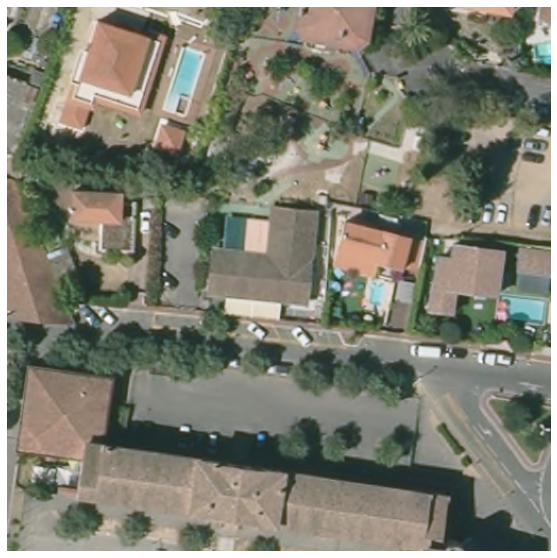

In [8]:
test_image = "test/test1.jpg"
result_image = os.path.splitext(test_image)[0] + '_predict.jpg'
viewimage(test_image)

In [9]:
callingazurecvmodel(0.5, test_image, result_image)

2022-02-17 15:07:53.638005 Calling Azure Custom Vision model...

Azure Custom Vision model results:

1 	swimming pool detected with confidence = 0.8594
	Bounding Box: [ 150 36 188 100 ]
	Approximated surface = 2432

2 	swimming pool detected with confidence = 0.8573
	Bounding Box: [ 462 269 510 300 ]
	Approximated surface = 1488

3 	swimming pool detected with confidence = 0.7985
	Bounding Box: [ 337 256 362 288 ]
	Approximated surface = 800

4 	swimming pool detected with confidence = 0.7059
	Bounding Box: [ 492 29 511 57 ]
	Approximated surface = 532


=> 4 swimming pools were detected in the image.


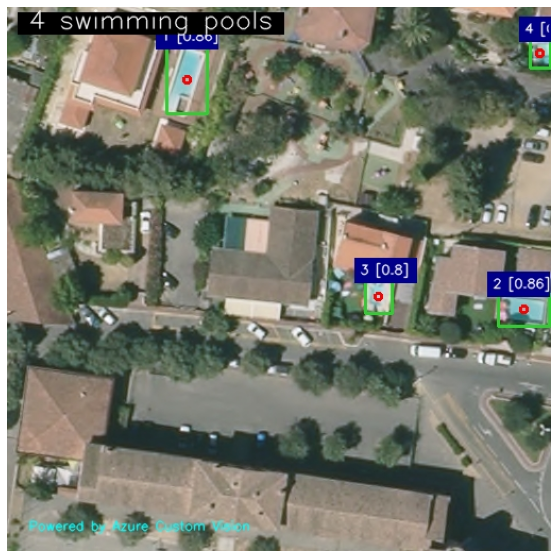

In [10]:
viewimage(result_image)

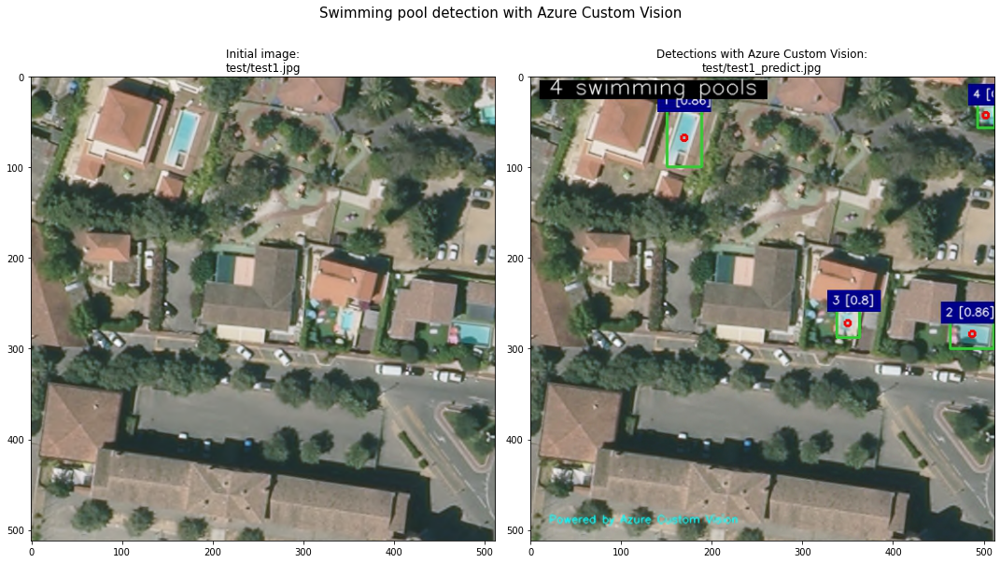

In [11]:
bothimages(test_image, result_image)

### Test 2

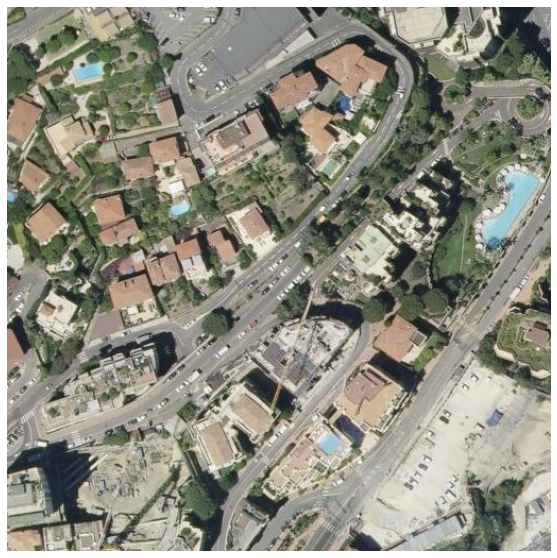

In [12]:
test_image = "test/test2.jpg"
result_image = os.path.splitext(test_image)[0] + '_predict.jpg'
viewimage(test_image)

In [13]:
callingazurecvmodel(0.5, test_image, result_image)

2022-02-17 15:07:57.291078 Calling Azure Custom Vision model...

Azure Custom Vision model results:

1 	swimming pool detected with confidence = 0.8254
	Bounding Box: [ 150 179 174 198 ]
	Approximated surface = 456

2 	swimming pool detected with confidence = 0.7945
	Bounding Box: [ 60 49 94 71 ]
	Approximated surface = 748

3 	swimming pool detected with confidence = 0.7917
	Bounding Box: [ 289 399 315 424 ]
	Approximated surface = 650

4 	swimming pool detected with confidence = 0.7811
	Bounding Box: [ 446 151 503 226 ]
	Approximated surface = 4275

5 	swimming pool detected with confidence = 0.7754
	Bounding Box: [ 309 81 328 102 ]
	Approximated surface = 399

6 	swimming pool detected with confidence = 0.6233
	Bounding Box: [ 0 167 10 187 ]
	Approximated surface = 200


=> 6 swimming pools were detected in the image.


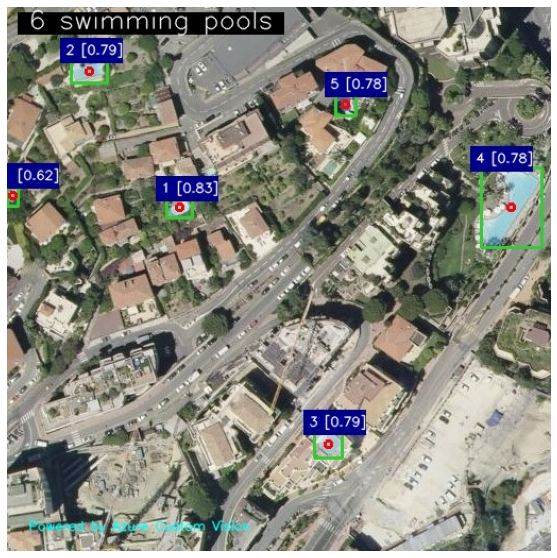

In [14]:
viewimage(result_image)

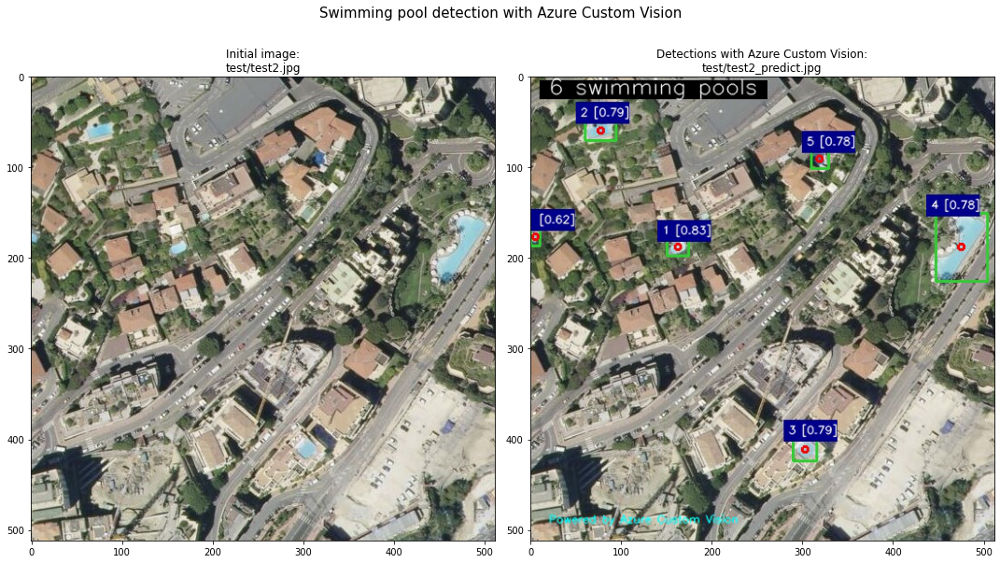

In [15]:
bothimages(test_image, result_image)

### Test 3

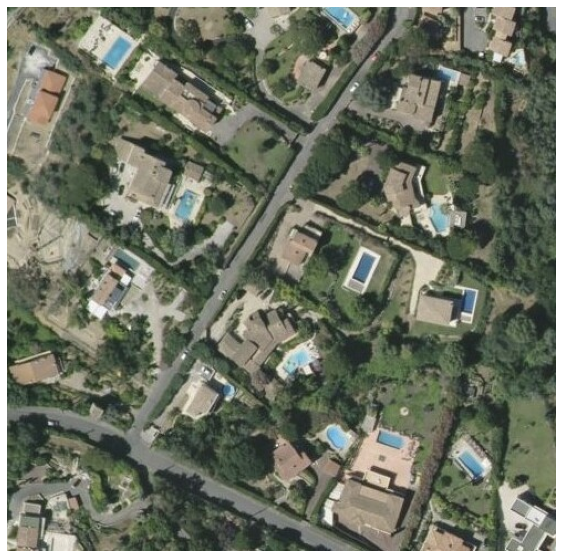

In [16]:
test_image = "test/test3.jpg"
result_image = os.path.splitext(test_image)[0] + '_predict.jpg'
viewimage(test_image)

In [17]:
callingazurecvmodel(0.4, test_image, result_image)

2022-02-17 15:08:00.313158 Calling Azure Custom Vision model...

Azure Custom Vision model results:

1 	swimming pool detected with confidence = 0.8606
	Bounding Box: [ 306 219 337 254 ]
	Approximated surface = 1085

2 	swimming pool detected with confidence = 0.8582
	Bounding Box: [ 84 24 115 57 ]
	Approximated surface = 1023

3 	swimming pool detected with confidence = 0.8295
	Bounding Box: [ 149 162 177 195 ]
	Approximated surface = 924

4 	swimming pool detected with confidence = 0.8285
	Bounding Box: [ 286 378 311 401 ]
	Approximated surface = 575

5 	swimming pool detected with confidence = 0.8176
	Bounding Box: [ 404 396 435 428 ]
	Approximated surface = 992

6 	swimming pool detected with confidence = 0.8106
	Bounding Box: [ 246 305 278 335 ]
	Approximated surface = 960

7 	swimming pool detected with confidence = 0.7983
	Bounding Box: [ 282 0 318 21 ]
	Approximated surface = 756

8 	swimming pool detected with confidence = 0.7864
	Bounding Box: [ 378 176 403 205 ]
	Approximate

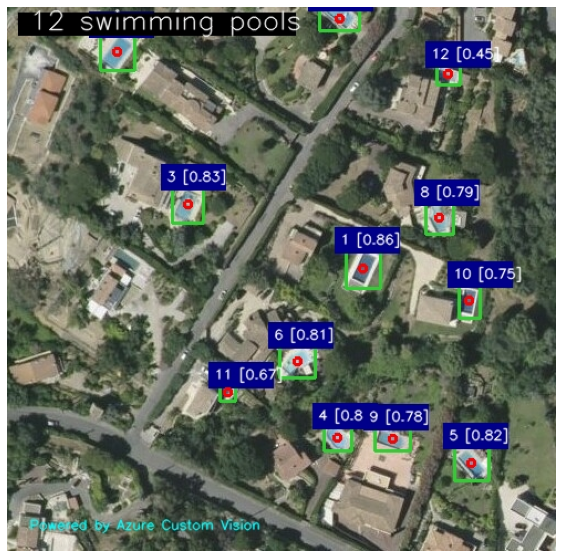

In [18]:
viewimage(result_image)

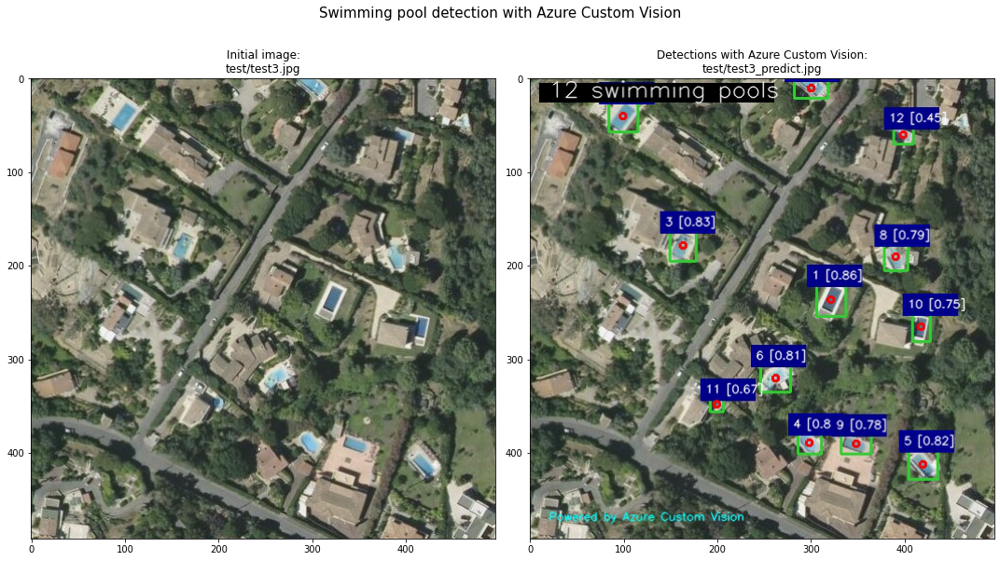

In [19]:
bothimages(test_image, result_image)

### Test 4

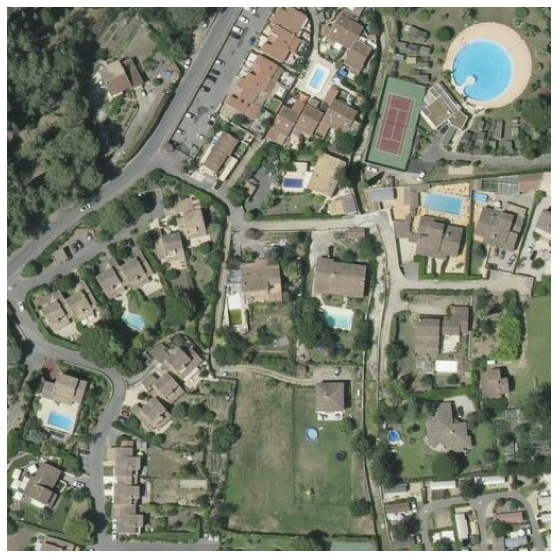

In [20]:
test_image = "test/test4.jpg"
result_image = os.path.splitext(test_image)[0] + '_predict.jpg'
viewimage(test_image)

In [21]:
callingazurecvmodel(0.5, test_image, result_image)

2022-02-17 15:08:03.519980 Calling Azure Custom Vision model...

Azure Custom Vision model results:

1 	swimming pool detected with confidence = 0.8374
	Bounding Box: [ 392 172 430 198 ]
	Approximated surface = 988

2 	swimming pool detected with confidence = 0.8241
	Bounding Box: [ 414 26 481 89 ]
	Approximated surface = 4221

3 	swimming pool detected with confidence = 0.8177
	Bounding Box: [ 293 281 326 304 ]
	Approximated surface = 759

4 	swimming pool detected with confidence = 0.81
	Bounding Box: [ 34 376 64 399 ]
	Approximated surface = 690

5 	swimming pool detected with confidence = 0.801
	Bounding Box: [ 107 280 133 305 ]
	Approximated surface = 650

6 	swimming pool detected with confidence = 0.8008
	Bounding Box: [ 356 394 373 412 ]
	Approximated surface = 306

7 	swimming pool detected with confidence = 0.8002
	Bounding Box: [ 282 54 304 79 ]
	Approximated surface = 550

8 	swimming pool detected with confidence = 0.7946
	Bounding Box: [ 256 156 282 174 ]
	Approximated su

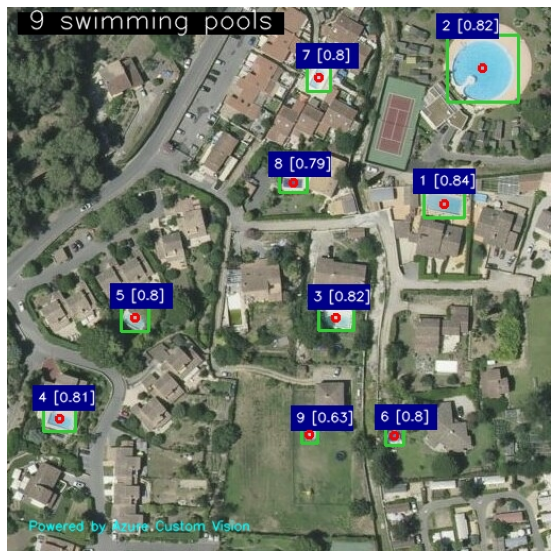

In [22]:
viewimage(result_image)

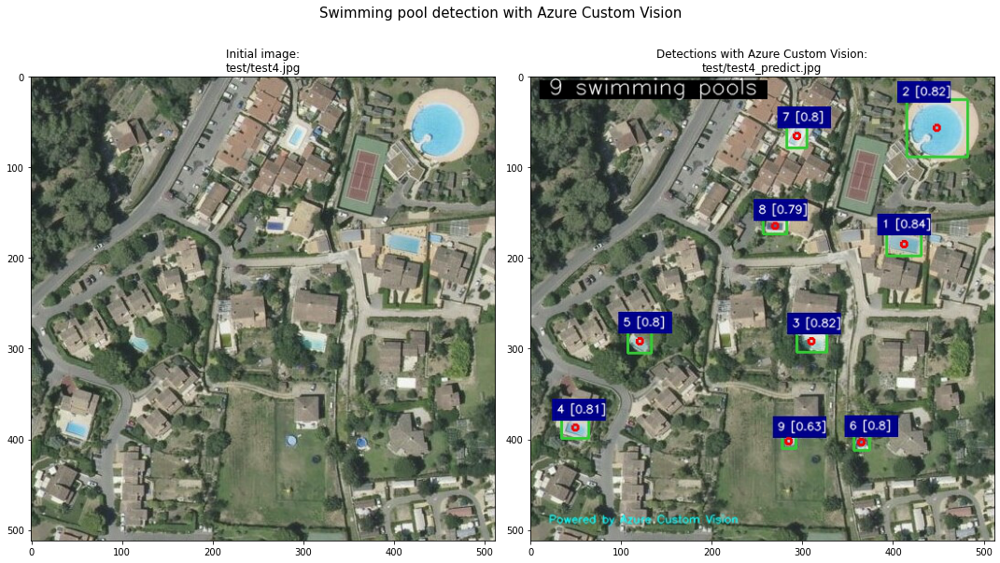

In [23]:
bothimages(test_image, result_image)

### Test 5

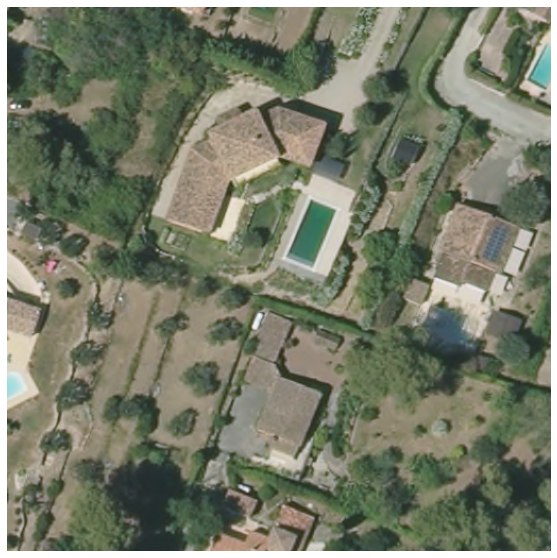

In [24]:
test_image = "test/test5.jpg"
result_image = os.path.splitext(test_image)[0] + '_predict.jpg'
viewimage(test_image)

In [25]:
callingazurecvmodel(0.74, test_image, result_image)

2022-02-17 15:08:06.718509 Calling Azure Custom Vision model...

Azure Custom Vision model results:

1 	swimming pool detected with confidence = 0.8567
	Bounding Box: [ 258 178 310 247 ]
	Approximated surface = 3588

2 	swimming pool detected with confidence = 0.7569
	Bounding Box: [ 0 338 22 380 ]
	Approximated surface = 924

3 	swimming pool detected with confidence = 0.7487
	Bounding Box: [ 487 22 511 82 ]
	Approximated surface = 1440


=> 3 swimming pools were detected in the image.


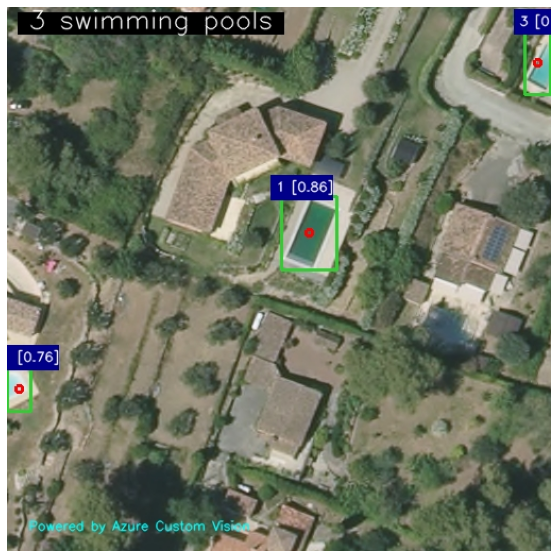

In [26]:
viewimage(result_image)

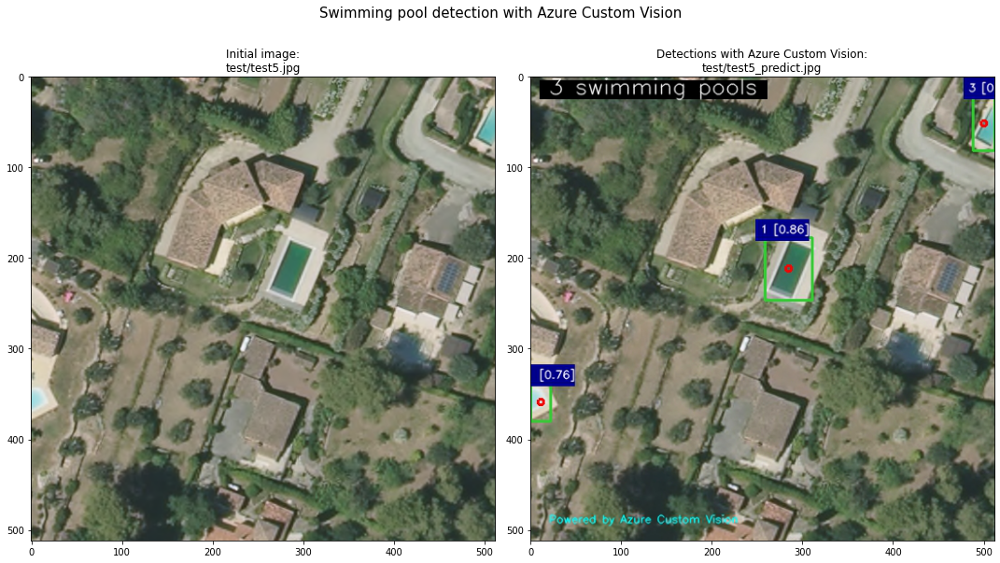

In [27]:
bothimages(test_image, result_image)

### Creation an animated gif from the results

In [28]:
if path.os.path.isdir("results") :
    print("Directory exists")
else:
    print("Creating directory:")
    os.mkdir("results")
    print("Done.")

Directory exists


In [29]:
i = 1
while i <= 5:
    src = 'test/test' + str(i) + '_both.jpg'
    dst = 'results/test' + str(i) + '_both.jpg'
    shutil.copyfile(src, dst)
    i += 1

In [30]:
print("Generating the animated GIF file...")

ANIMATED_GIF = 'animatedgif.gif'
RES_DIR = 'results'
IMAGES2GIF = []

for filename in os.listdir(RES_DIR):
    IMAGES2GIF.append(imageio.imread(RES_DIR + '/' + filename))
    imageio.mimsave(ANIMATED_GIF, IMAGES2GIF, duration = 3, fps = 60)

print("\nDone. File has been created:")
!ls *.gif -lh

Generating the animated GIF file...

Done. File has been created:
-rwxrwxrwx 1 root root 2.3M Feb 17 15:08 animatedgif.gif


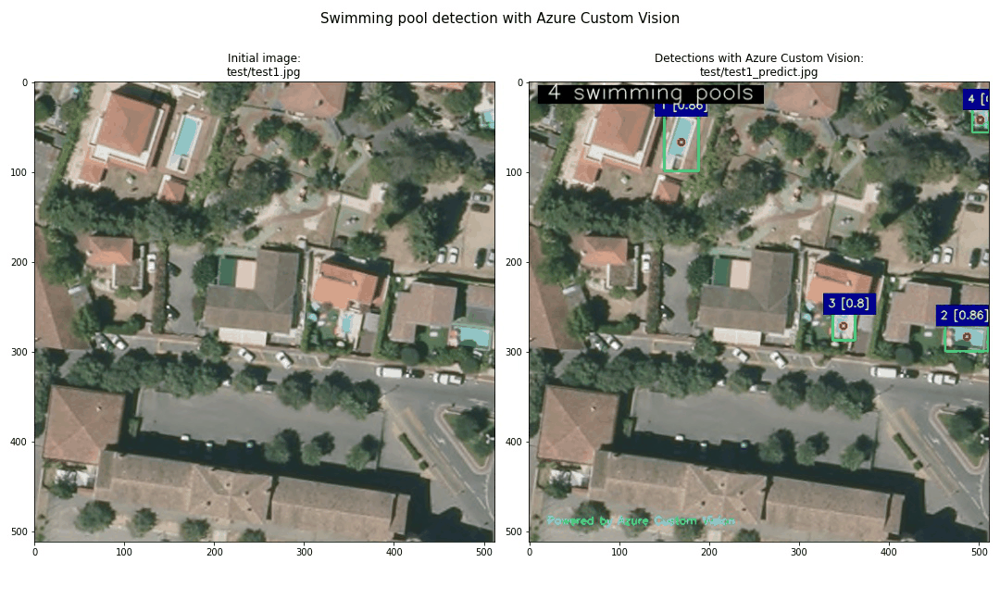

In [31]:
from IPython.display import Image
Image(filename = ANIMATED_GIF) 

In [32]:
from IPython.display import FileLink
LINK = FileLink(path = ANIMATED_GIF)
print("Click to download the file:")
LINK

Click to download the file:


/mnt/batch/tasks/shared/LS_root/mounts/clusters/seretkow9/code/Users/seretkow/ComputerVision/swimmingpool/animatedgif.gif